## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---


## Libraries

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline

## Helper functions

In [2]:
def convert_BRG_to_RGB(bgr_img):
    b,g,r = cv2.split(bgr_img)
    return cv2.merge([r,g,b])

def convert_RGB_to_BRG(rgb_img):
    r,g,b = cv2.split(rgb_img)
    return cv2.merge([b,g,r])

def display_image(original_img,undistorted_img,original_img_title,undistorted_img_title):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(original_img)
    ax1.set_title(original_img_title, fontsize=50)
    ax2.imshow(undistorted_img)
    ax2.set_title(undistorted_img_title, fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

def display_image_with_gray_cmap(original_img,undistorted_img,original_img_title,undistorted_img_title):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(original_img)
    ax1.set_title(original_img_title, fontsize=50)
    ax2.imshow(undistorted_img, cmap='gray')
    ax2.set_title(undistorted_img_title, fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
def apply_Sobel_x(gray):
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    return scaled_sobel

def apply_treshhold_gradient_on_x(scaled_sobel,tresh_min,tresh_max):
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= tresh_min) & (scaled_sobel <= tresh_max)] = 1
    return sxbinary

def apply_treshhold_color_channel(hls,s_thresh_min,s_thresh_max):
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    return s_binary


def mask_img(undistorted_img,ignore_mask_color,):
    mask = np.zeros_like(undist)
    imshape = undist.shape
    vertices = np.array([[(200,imshape[0]),(520, 500), (763, 500), (1110,imshape[0])]], dtype=np.int32)
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    masked_img = cv2.bitwise_or(undist, mask)
    return masked_img

def warp_img(undist,masked_img):
    imshape = undist.shape
    vertices = np.array([[(200,imshape[0]),(520, 500), (763, 500), (1110,imshape[0])]], dtype=np.int32)
    warp_vertices = np.array([[(300,imshape[0]),(300, 500), (imshape[1]-300, 500), (imshape[1]-300,imshape[0])]], dtype=np.int32)
    M = cv2.getPerspectiveTransform(vertices.astype(np.float32), warp_vertices.astype(np.float32))
    Minv = cv2.getPerspectiveTransform(warp_vertices.astype(np.float32), vertices.astype(np.float32))
    warped_img = cv2.warpPerspective(masked_img, M, (imshape[1], imshape[0]), flags=cv2.INTER_LINEAR)
    return warped_img


def convert_to_warp_treshold_img(img):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    gray = cv2.cvtColor(undist,cv2.COLOR_BGR2GRAY)
    hue_saturation_lightness = cv2.cvtColor(undist, cv2.COLOR_BGR2HLS) #HSL
    
    scaled_sobel = apply_Sobel_x(gray)
    sxbinary= apply_treshhold_gradient_on_x(scaled_sobel,20,100)
    s_binary = apply_treshhold_color_channel(hue_saturation_lightness,80,255)
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    warpe_treshold_img=warp_img(undist,combined_binary)
    return warpe_treshold_img


    


## Compute the camera calibration using chessboard images

In [3]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('../camera_cal/calibration*.jpg')


# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

cv2.destroyAllWindows()

### Calculate the undistortation of images

In [4]:
def calculate_undistortion(img,nx,ny,objpoints, imgpoints):
    # Use cv2.calibrateCamera() and cv2.undistort()
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    #Search for corners in the grayscaled image
    ret, corners = cv2.findChessboardCorners(gray, (8,6), None)
    img = cv2.drawChessboardCorners(img, (8,6), corners, ret)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist, mtx, dist

### Test the Undistortation of on Chessboard images

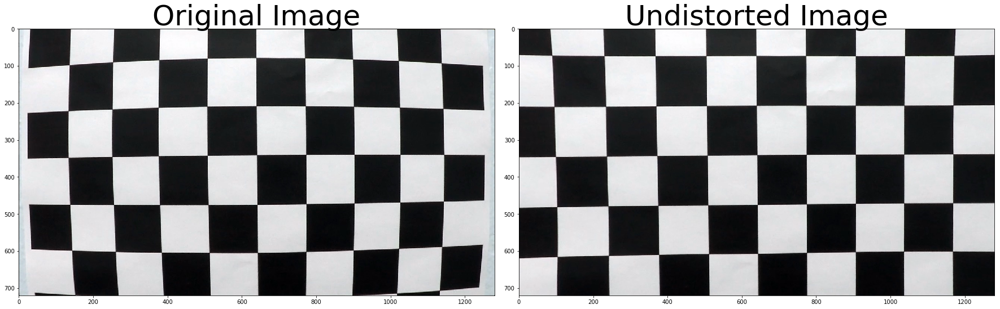

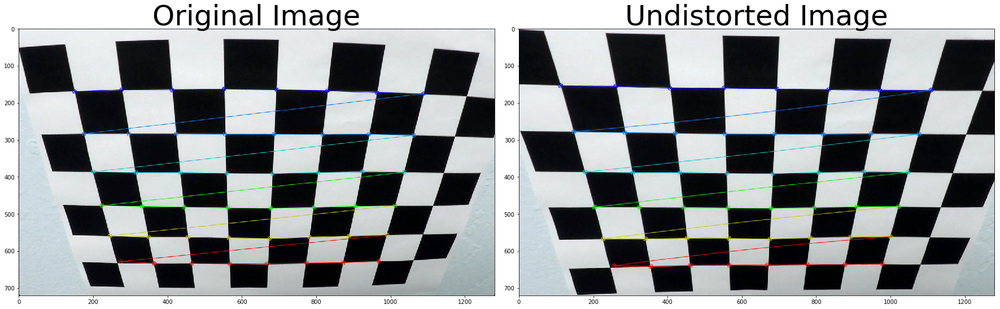

In [5]:
images = ['../camera_cal/calibration1.jpg', '../camera_cal/calibration2.jpg']
for image in images:
    original_img = cv2.imread(image)
    undistorted_img, mtx, dist = calculate_undistortion(original_img,8,6,objpoints, imgpoints)
    display_image(original_img,undistorted_img,"Original Image","Undistorted Image")

### Check Camera Calibration Matrix and Distortion Coefficients

In [6]:
print("Camera Calibration Matris is:\n{}".format(mtx))

Camera Calibration Matris is:
[[1.15777942e+03 0.00000000e+00 6.67111049e+02]
 [0.00000000e+00 1.15282305e+03 3.86129069e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]


In [7]:
print("Distortion Coefficients is:\n{}".format(dist))

Distortion Coefficients is:
[[-0.24688833 -0.02372815 -0.00109843  0.00035105 -0.00259137]]


# Apply a distortion correction to raw images.

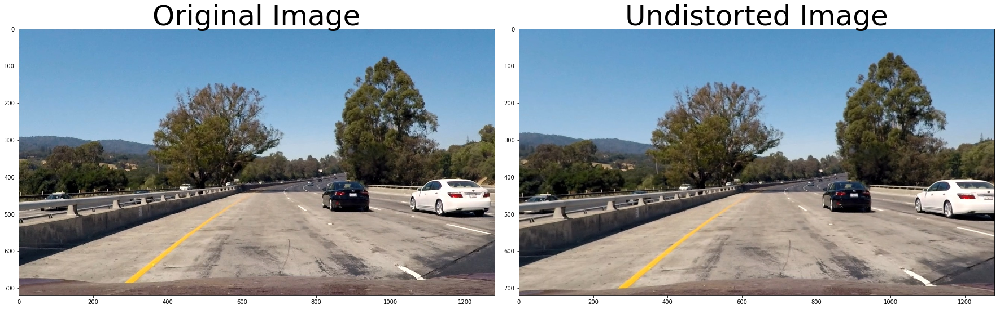

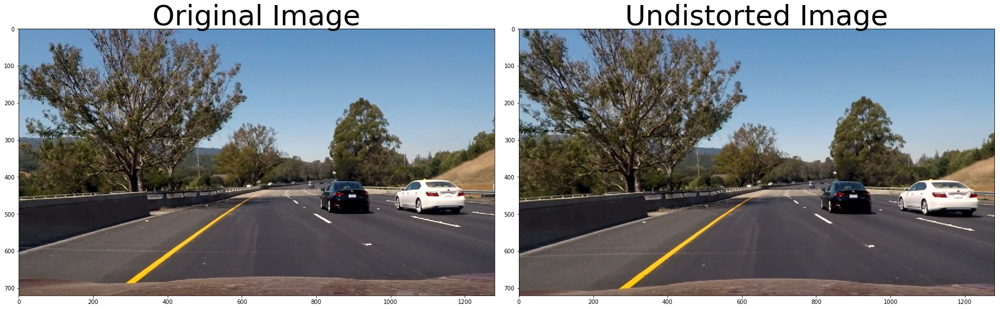

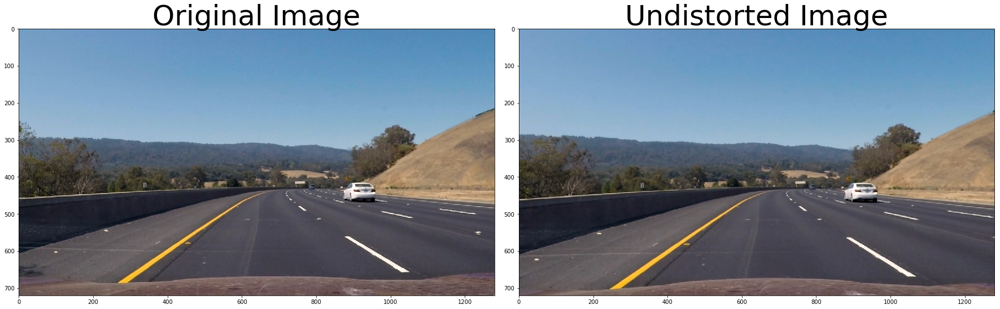

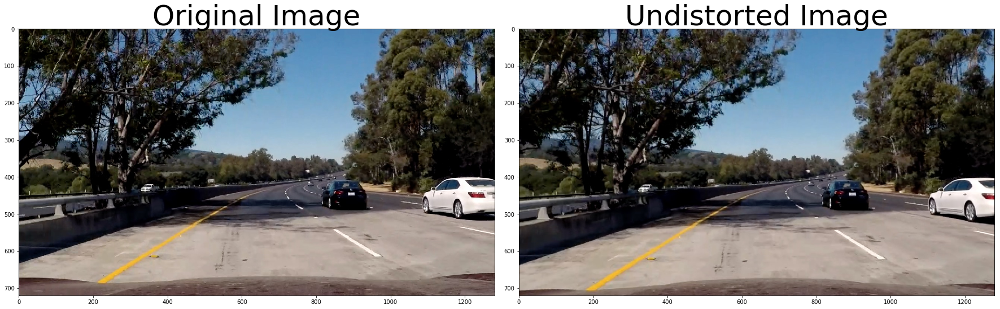

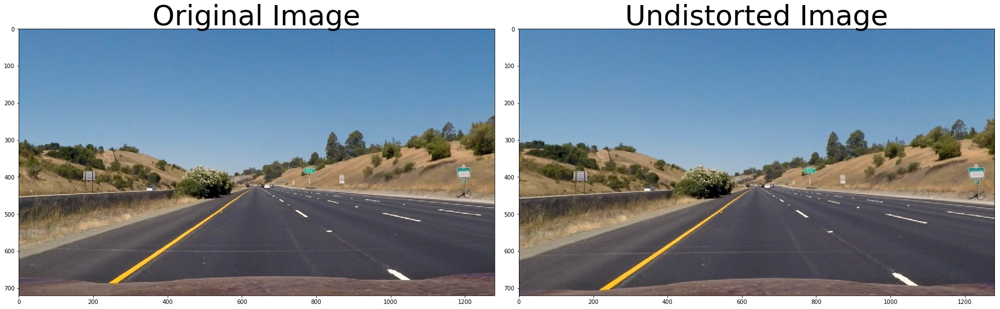

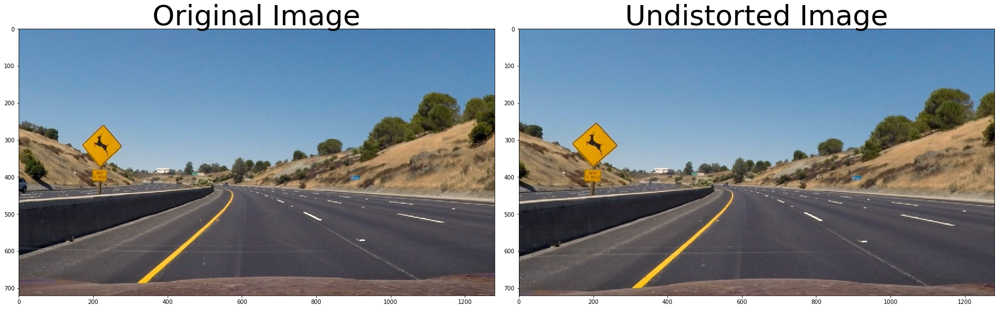

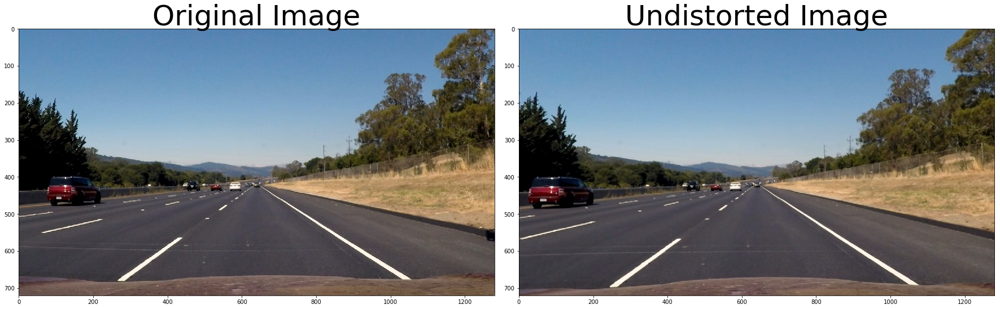

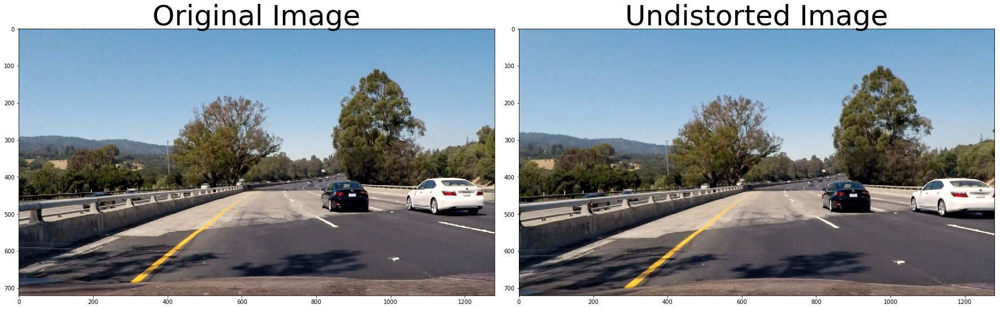

In [8]:
test_images = glob.glob('../test_images/*.jpg')
for image in test_images:
    original_img = cv2.imread(image)
    undistorted_img = cv2.undistort(original_img, mtx, dist, None, mtx)
    display_image(convert_BRG_to_RGB(original_img),convert_RGB_to_BRG(undistorted_img),'Original Image','Undistorted Image')

# Use color transforms, gradients to create a thresholded binary image

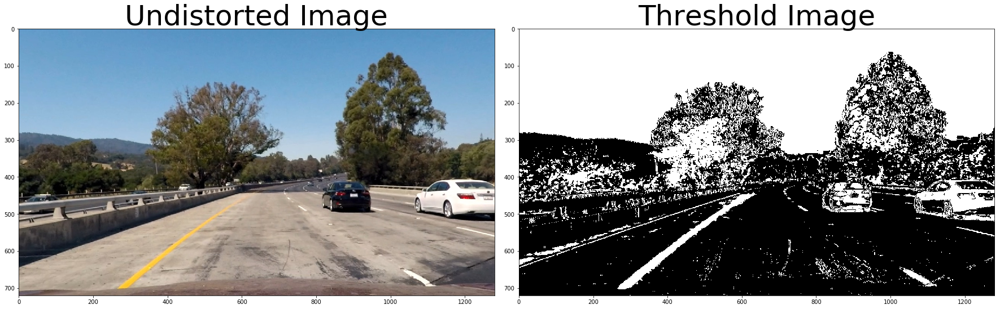

In [9]:
test_img = cv2.imread('../test_images/test1.jpg')
undist = cv2.undistort(test_img, mtx, dist, None, mtx)
gray = cv2.cvtColor(undist,cv2.COLOR_BGR2GRAY)
hue_saturation_lightness = cv2.cvtColor(undist, cv2.COLOR_BGR2HLS) #HSL

scaled_sobel = apply_Sobel_x(gray)
sxbinary= apply_treshhold_gradient_on_x(scaled_sobel,20,100)
s_binary = apply_treshhold_color_channel(hue_saturation_lightness,80,255)

color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
combined_binary = np.zeros_like(sxbinary)
combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1

display_image_with_gray_cmap(convert_BRG_to_RGB(undist),combined_binary,'Undistorted Image','Threshold Image')







# Apply a perspective transform to rectify binary image ("birds-eye view")

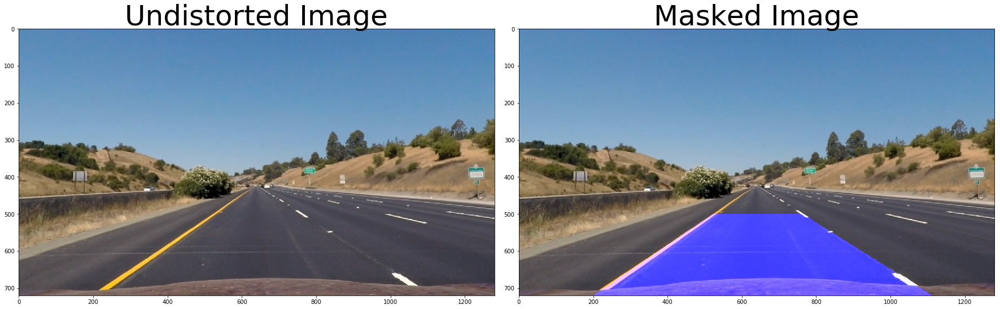

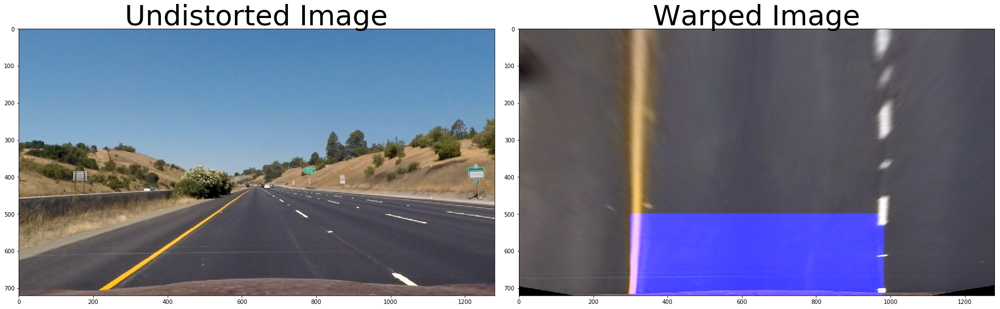

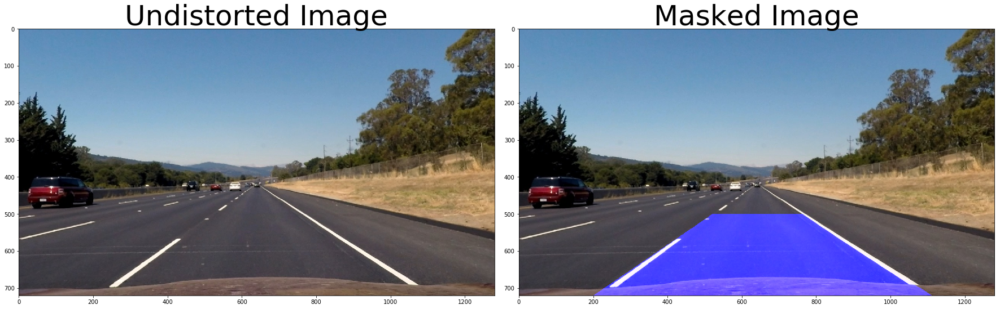

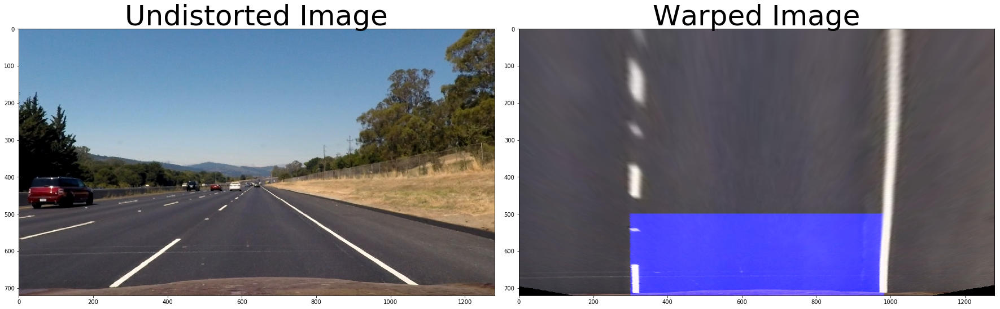

In [24]:
test_images = ['../test_images/straight_lines1.jpg', '../test_images/straight_lines2.jpg']
for image in test_images:
    straight_line_img = cv2.imread(image)
    undist = cv2.undistort(straight_line_img, mtx, dist, None, mtx)
    masked_img = mask_img(undist,255)
    warped_img = warp_img(undist,masked_img)
    display_image(convert_BRG_to_RGB(undist),convert_BRG_to_RGB(masked_img),"Undistorted Image","Masked Image")
    display_image(convert_BRG_to_RGB(undist),convert_BRG_to_RGB(warped_img),"Undistorted Image","Warped Image")





# Detect lane pixels and fit to find the lane boundary.

## Convert Original Image to Warp Treshhold Image

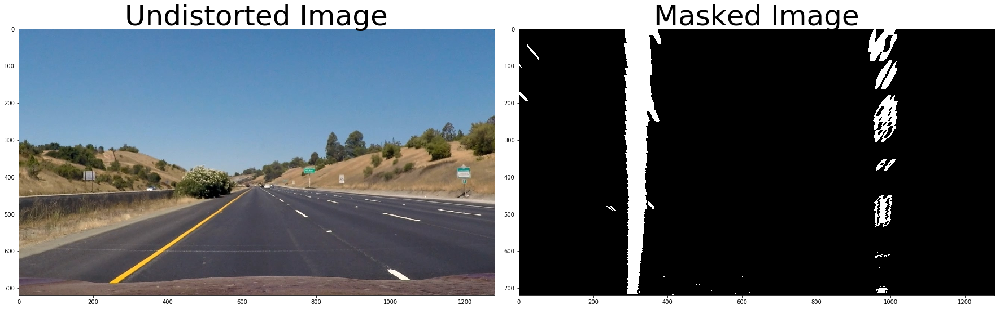

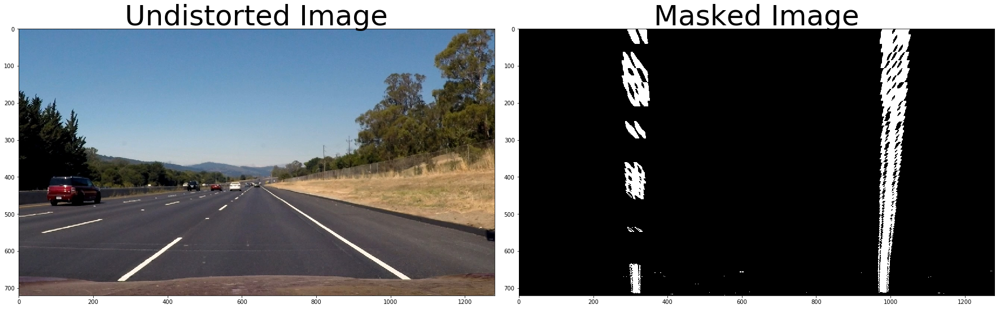

In [50]:
test_images = ['../test_images/straight_lines1.jpg', '../test_images/straight_lines2.jpg']
for image in test_images:
    straight_line_img = cv2.imread(image)
    warped_threshold_img=convert_to_warp_treshold_img(straight_line_img)
    display_image_with_gray_cmap(convert_BRG_to_RGB(straight_line_img),warped_threshold_img,"Undistorted Image","Masked Image")

    

## Find Line Histogram

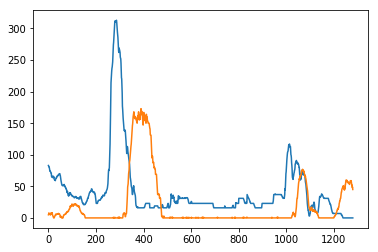

In [53]:
test_images = ['../test_images/test5.jpg', '../test_images/test6.jpg']
for image in test_images:
    straight_line_img = cv2.imread(image)
    warped_threshold_img=convert_to_warp_treshold_img(straight_line_img)
    histogram = np.sum(warped_threshold_img[warped_threshold_img.shape[0]//2:,:], axis=0)
    plt.plot(histogram)

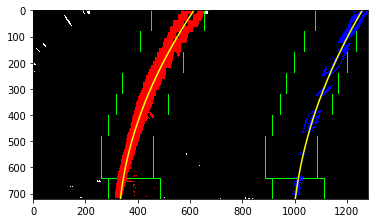

In [86]:
def plot_sliding_window_fit_left_and_right_lane(warped_threshold_img, nwindows, margin, minpix):
    histogram = np.sum(warped_threshold_img[warped_threshold_img.shape[0] // 2:, :], axis=0)

    # Find the peak of the left and right halves of the histogram
    midpoint = np.int(histogram.shape[0] / 2)
    leftx_current = np.argmax(histogram[:midpoint])
    rightx_current = np.argmax(histogram[midpoint:]) + midpoint

    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((warped_threshold_img, warped_threshold_img, warped_threshold_img)) * 255

    # Set height of windows
    window_height = np.int(warped_threshold_img.shape[0] / nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = warped_threshold_img.nonzero()
    non_zero_y = np.array(nonzero[0])
    non_zero_x = np.array(nonzero[1])

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = warped_threshold_img.shape[0] - (window + 1) * window_height
        win_y_high = warped_threshold_img.shape[0] - window * window_height
        win_x_left_low = leftx_current - margin
        win_x_left_high = leftx_current + margin
        win_x_right_low = rightx_current - margin
        win_x_right_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img, (win_x_left_low, win_y_low), (win_x_left_high, win_y_high),
                      (0, 255, 0), 2)
        cv2.rectangle(out_img, (win_x_right_low, win_y_low), (win_x_right_high, win_y_high),
                      (0, 255, 0), 2)

        # Identify the nonzero pixels in x and y within the window
        good_left_indices = ((non_zero_y >= win_y_low) & (non_zero_y < win_y_high) &
                          (non_zero_x >= win_x_left_low) & (non_zero_x < win_x_left_high)).nonzero()[0]
        good_right_indices = ((non_zero_y >= win_y_low) & (non_zero_y < win_y_high) &
                           (non_zero_x >= win_x_right_low) & (non_zero_x < win_x_right_high)).nonzero()[0]

        # Append these indices to the lists
        left_lane_inds.append(good_left_indices)
        right_lane_inds.append(good_right_indices)

        # If you found > minpix pixels, recenter next window on their mean position
        leftx_new = 0
        rightx_new = 0
        if len(good_left_indices) > minpix:
            leftx_new = np.int(np.mean(non_zero_x[good_left_indices])) - leftx_current
        if len(good_right_indices) > minpix:
            rightx_new = np.int(np.mean(non_zero_x[good_right_indices])) - rightx_current

        # move window in parallel
        if (leftx_new > 0) and (rightx_new > 0):
            leftx_current += int((leftx_new + rightx_new) / 2)
            rightx_current += int((leftx_new + rightx_new) / 2)
        if (leftx_new < 0) and (rightx_new < 0):
            leftx_current += int((leftx_new + rightx_new) / 2)
            rightx_current += int((leftx_new + rightx_new) / 2)

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = non_zero_x[left_lane_inds]
    lefty = non_zero_y[left_lane_inds]
    rightx = non_zero_x[right_lane_inds]
    righty = non_zero_y[right_lane_inds]

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, warped_threshold_img.shape[0] - 1, warped_threshold_img.shape[0])
    left_fitx = left_fit[0] * ploty ** 2 + left_fit[1] * ploty + left_fit[2]
    right_fitx = right_fit[0] * ploty ** 2 + right_fit[1] * ploty + right_fit[2]
    out_img[non_zero_y[left_lane_inds], non_zero_x[left_lane_inds]] = [255, 0, 0]
    out_img[non_zero_y[right_lane_inds], non_zero_x[right_lane_inds]] = [0, 0, 255]
    plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)


nwindows = 9
margin = 100
minpix = 50

test_img_1 = cv2.imread('../test_images/test1.jpg')
warped_threshold_img_3 = convert_to_warp_treshold_img(test_img_3)
plot_sliding_window_fit_left_and_right_lane(warped_threshold_img_3, nwindows, margin, minpix)


# Determine the curvature of the lane and vehicle position with respect to center